In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import chromatac as ca

ModuleNotFoundError: No module named 'chromatac'

In [2]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import chromATAC as ca
from chromATAC.integrated import IntData
from functools import reduce
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as mcolors
from tqdm import tqdm
import warnings
import seaborn as sns
import matplotlib.gridspec as gridspec
from scipy.cluster import hierarchy

warnings.simplefilter("ignore", category=pd.errors.ParserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
parent_dir = '/Users/mossishahi/Code/lupien/IntData/'

In [5]:
tes_dir = parent_dir+'/data/V2-TEs/non_olap'
cotes_dir = parent_dir+'/data/V2-TEs/non_olap/cores1000'

In [6]:
TEs = np.array([i.split('.')[0] for i in os.listdir(tes_dir) if i.endswith('.bed')])
COTEs = np.array([i.split('.')[0] for i in os.listdir(cotes_dir) if i.endswith('.bed')])

In [7]:
te_meta = pd.read_csv(parent_dir+'/analysis/data/repeat_metadata.onlyTEs_full.tsv', sep='\t')
te_df = te_meta.iloc[np.concatenate([np.where(te_meta['repname_numbered'].apply(lambda x: i.split('_')[0]==x.split('_')[0]))[0] for i in TEs]), :].loc[:, ['repname', 'Superfamily', 'repname_numbered']].copy()
te_df.index = range(1, len(te_df)+1)
te_df['COTE'] = te_df['repname_numbered'].apply(lambda x: x.split('_')[0] in np.array([i.split('_')[0] for i in np.intersect1d(TEs, COTEs)]))
te_df.loc[971] = ['ERV3-16A3_I-int', 'ERVL', '369_ERV3-16A3_I-int', True]

In [9]:
te_n_elements = pd.read_csv(tes_dir+'/n_elements_per_TE.tsv', sep='\t', header=None, names = ['name', 'n_elements'])
cote_n_elments = pd.read_csv(cotes_dir+'/n_clusters_per_TE.tsv', sep='\t', header=None, names = ['name', 'n_clusters'])

In [10]:
te_n_elements['name'] = te_n_elements['name'].apply(lambda x: x.split('_Merged.bed')[0])
cote_n_elments['name'] = cote_n_elments['name'].apply(lambda x: x.split('_Merged.bed')[0])
te_df = te_df.merge(te_n_elements, how='left', left_on='repname_numbered', right_on='name').merge(cote_n_elments, how='left', left_on='repname_numbered', right_on='name').drop(['name_x', 'name_y'], axis=1).fillna(0)
te_df.set_index('repname_numbered', inplace=True)

-------

## CNV and CoTEs

In [11]:
chroms = ca.info.CHROMOSOMES['names']

<Axes: >

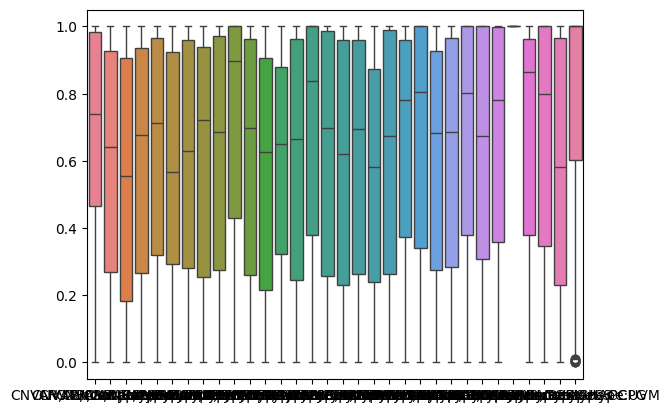

In [15]:
df = pd.read_csv(parent_dir + 'analysis/experiment11/loss/chr7__pval_n_hit.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
sns.boxplot(df)

<Axes: >

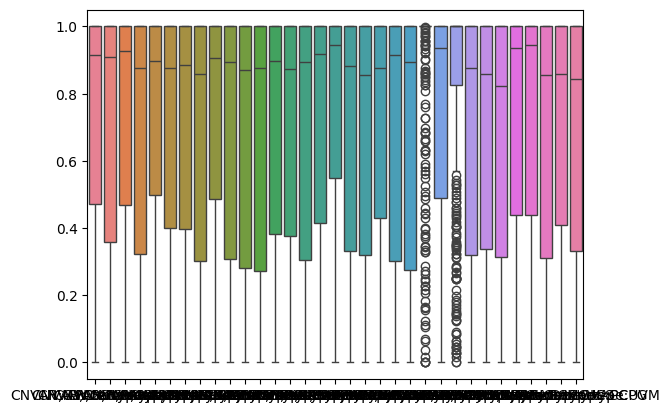

In [17]:
df = pd.read_csv(parent_dir + 'analysis/experiment11/loss/chr1__qval_n_hit.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
sns.boxplot(df)

<Axes: >

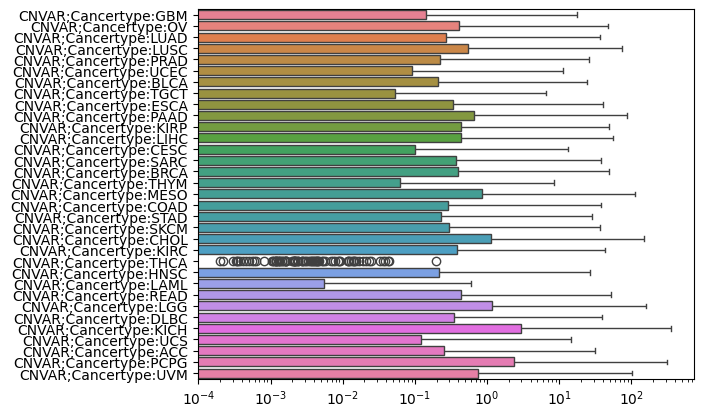

In [20]:
df = pd.read_csv('/Users/mossishahi/Code/lupien/IntData/analysis/experiment17/loss/chr1__n_hits.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
plt.xscale('log')
sns.boxplot(df, orient='h')

<Axes: >

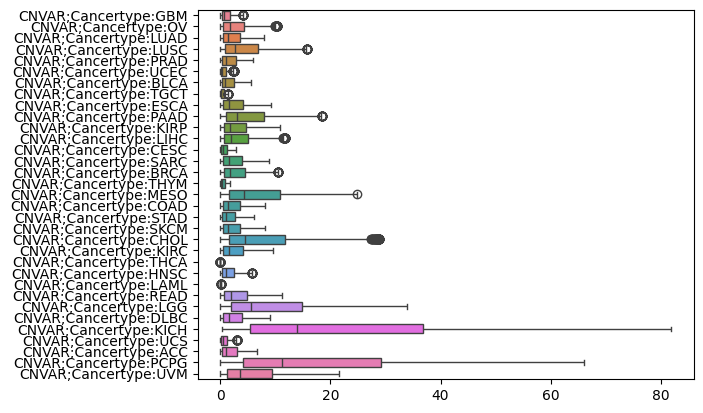

In [18]:
df = pd.read_csv('/Users/mossishahi/Code/lupien/IntData/analysis/experiment12/loss/chr1__n_hits.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
sns.boxplot(df, orient='h')

<Axes: >

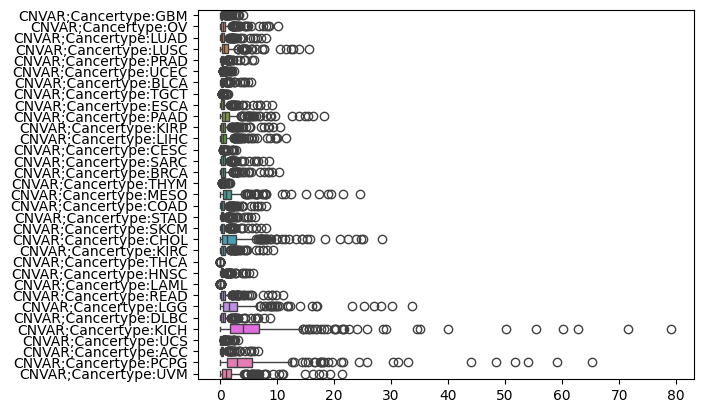

In [21]:
df = pd.read_csv(parent_dir + 'analysis/experiment11/loss/chr1__n_hits.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
sns.boxplot(df, orient='h')

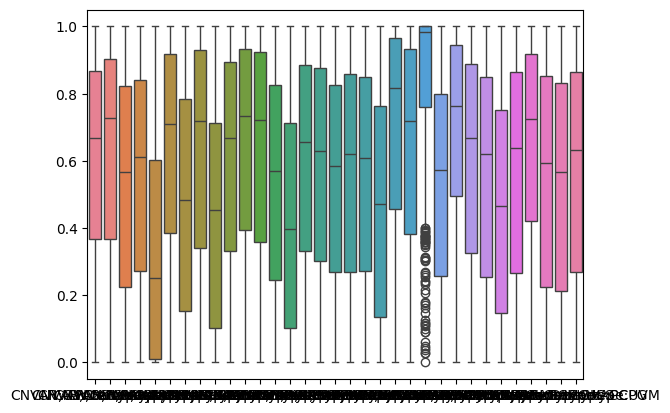

<Axes: ylabel='Density'>

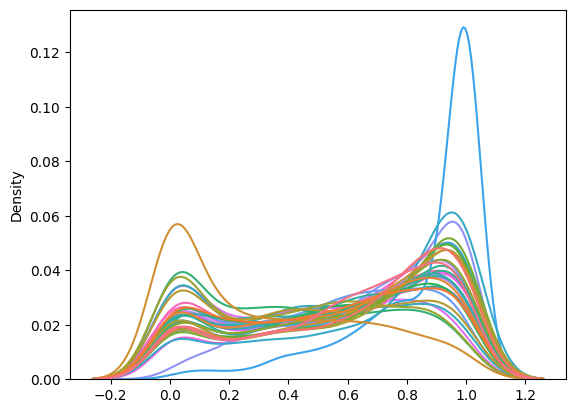

In [72]:
df = pd.read_csv('/Users/mossishahi/Code/lupien/IntData/analysis/experiment12/loss/chr1__qval_n_hit.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
sns.boxplot(df)
plt.show()
sns.kdeplot(df, legend=False)

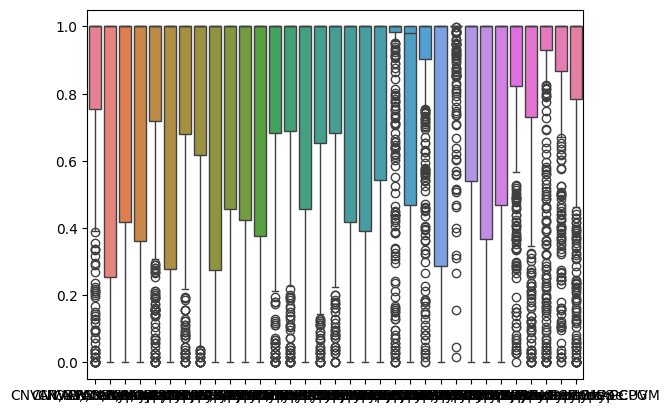

<Axes: ylabel='Density'>

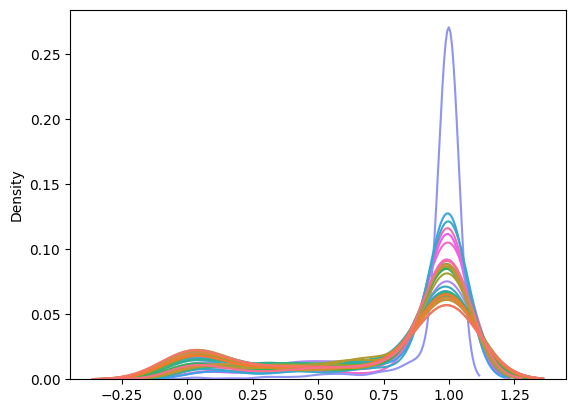

In [73]:
df = pd.read_csv('/Users/mossishahi/Code/lupien/IntData/analysis/experiment11/loss/chrX__qval_n_hit.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
sns.boxplot(df)
plt.show()
sns.kdeplot(df, legend=False)

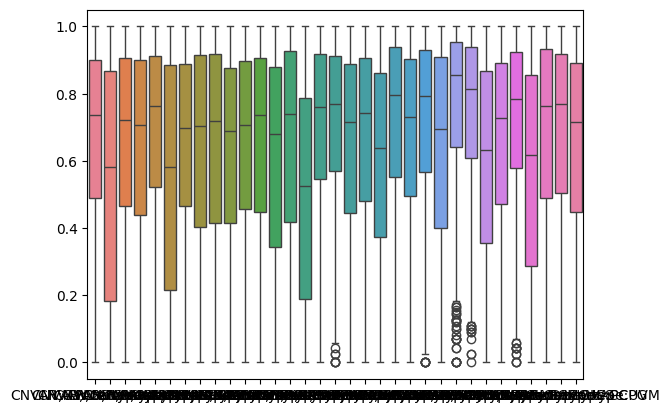

<Axes: ylabel='Density'>

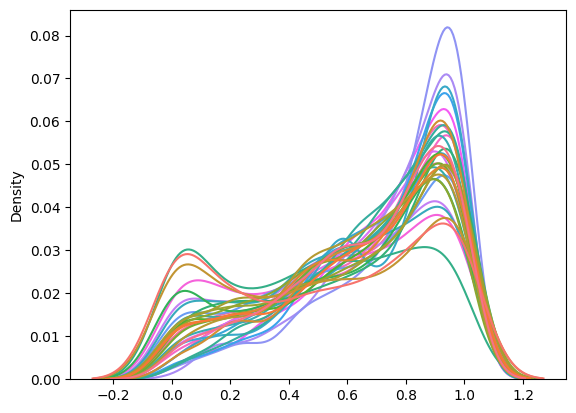

In [75]:
df = pd.read_csv('/Users/mossishahi/Code/lupien/IntData/analysis/experiment12/loss/chrX__qval_n_hit.csv', index_col=False)
df = df.rename(columns={'Unnamed: 0': 'CoTE'})
df = df.set_index('CoTE')
sns.boxplot(df)
plt.show()
sns.kdeplot(df, legend=False)

In [12]:
cnv_meta = pd.read_csv("/Users/mossishahi/Code/lupien/IntData/data/CNVAR/summary.ascatv3TCGA.penalty70.hg38.tsv", sep='\t')

In [13]:
cnv_meta

,name,patient,cancer_type,sex,barcodeTumour,barcodeNormal,tumour_mapd,normal_mapd,GC_correction_before,GC_correction_after,...,homdel_segs,homdel_largest,homdel_size,homdel_fraction,LOH,mode_minA,mode_majA,WGD,GI,QC
0,TCGA-02-0001,TCGA-02-0001,GBM,XX,TCGA-02-0001-01C-01D-0182-01,TCGA-02-0001-10A-01D-0182-01,0.2828,0.2716,50bp=0.1388 / 5kb=0.1201,50bp=0 / 5kb=0,...,1,351838,351838,0.000120,0.2044,1,1,0,0.6177,Pass
1,TCGA-02-0003,TCGA-02-0003,GBM,XY,TCGA-02-0003-01A-01D-0182-01,TCGA-02-0003-10A-01D-0182-01,0.2744,0.3040,25bp=0.0571 / 10kb=0.0383,25bp=0 / 10kb=0,...,0,0,0,0.000000,0.0969,1,1,0,0.1548,Pass
2,TCGA-02-0006,TCGA-02-0006,GBM,XX,TCGA-02-0006-01B-01D-0182-01,TCGA-02-0006-10A-01D-0182-01,0.2643,0.2938,1kb=0.0347 / 5kb=0.0425,1kb=0 / 5kb=0,...,1,1475622,1475622,0.000505,0.1230,2,2,1,0.2603,Pass
3,TCGA-02-0007,TCGA-02-0007,GBM,XX,TCGA-02-0007-01A-01D-0182-01,TCGA-02-0007-10A-01D-0182-01,0.2245,0.2923,25bp=0.1397 / 5kb=0.0343,25bp=0 / 5kb=0,...,0,0,0,0.000000,0.1988,1,1,0,0.2333,Pass
4,TCGA-02-0009,TCGA-02-0009,GBM,XX,TCGA-02-0009-01A-01D-0182-01,TCGA-02-0009-10A-01D-0182-01,0.2317,0.2586,25bp=0.0962 / 5kb=0.0786,25bp=0 / 5kb=0,...,2,3187692,4363726,0.001482,0.0909,1,1,0,0.1688,Pass
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10672,TCGA-ZS-A9CF-a,TCGA-ZS-A9CF,LIHC,XY,TCGA-ZS-A9CF-01A-11D-A381-01,TCGA-ZS-A9CF-10A-01D-A384-01,0.2320,0.4000,1kb=0.1722 / 20kb=0.1752,1kb=0 / 20kb=0,...,5,290286,721549,0.000245,0.1611,1,1,0,0.2327,Pass
10673,TCGA-ZS-A9CG,TCGA-ZS-A9CG,LIHC,XY,TCGA-ZS-A9CG-01A-11D-A36W-01,TCGA-ZS-A9CG-10A-01D-A36Z-01,0.2495,0.3668,1kb=0.1 / 50kb=0.1065,1kb=0 / 50kb=0,...,0,0,0,0.000000,0.0885,2,2,1,0.2499,Pass
10674,TCGA-ZT-A8OM,TCGA-ZT-A8OM,THYM,XX,TCGA-ZT-A8OM-01A-11D-A427-01,TCGA-ZT-A8OM-10A-01D-A42A-01,0.2262,0.4348,25bp=0.1273 / 50kb=0.1215,25bp=0 / 50kb=0,...,0,0,0,0.000000,0.0001,1,1,0,0.0001,Likely normal
10675,TCGA-ZU-A8S4-a,TCGA-ZU-A8S4,CHOL,XY,TCGA-ZU-A8S4-01A-11D-A416-01,TCGA-ZU-A8S4-10A-01D-A419-01,0.1951,0.3621,25bp=0.0751 / 100kb=0.0508,25bp=0 / 100kb=0,...,3,2884015,3808092,0.001293,0.1825,1,1,0,0.1997,Pass


## Gain CNV

FileNotFoundError: [Errno 2] No such file or directory: '/cluster/home/t124771uhn/analysis/experiment11/loss/chrX__spcf_n_hits.csv'

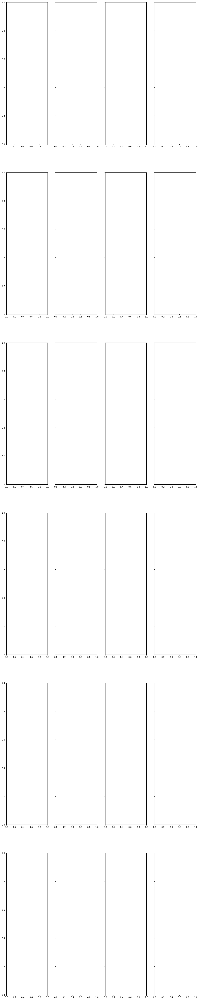

In [83]:
fig, axs = plt.subplots(6, 4, figsize=(16, 84), sharey=True)
for i, c in enumerate(chroms[-2:-1]):
    # Calculate the row and column indices
    row_idx = i // 2
    col_idx_df1 = (i % 2) * 2
    col_idx_df2 = ((i % 2) * 2) + 1
    df = pd.read_csv(f'{}/analysis/experiment11/loss/{c}__spcf_n_hits.csv', index_col=False)
    df = df.rename(columns={'Unnamed: 0': 'CoTE'})
    df = df.set_index('CoTE')
    sns.boxplot(df, orient='h', showfliers=True, ax=axs[row_idx][col_idx_df1], flierprops=dict(marker='o', markersize=0.5, linestyle='none', markeredgecolor='grey'))
    axs[row_idx][col_idx_df1].set_title(f'Matrix W > {c}')
    df = pd.read_csv(f'/cluster/home/t124771uhn/analysis/experiment11/loss/{c}__n_hits.csv', index_col=False)
    df = df.rename(columns={'Unnamed: 0': 'CoTE'})
    df = df.set_index('CoTE')
    sns.boxplot(df, orient='h', showfliers=True, ax=axs[row_idx][col_idx_df2], flierprops=dict(marker='*', markersize=0.5, linestyle='none', markeredgecolor='grey'))
    axs[row_idx][col_idx_df2].set_title(f'Matrix G > {c}')
    # sns.stripplot(df, orient='h', jitter=True, ax=axs.flatten()[i], color='grey')
fig.savefig('chr1__spcf_n_hits.pdf', dpi=600, bbox_inches='tight')
plt.show()

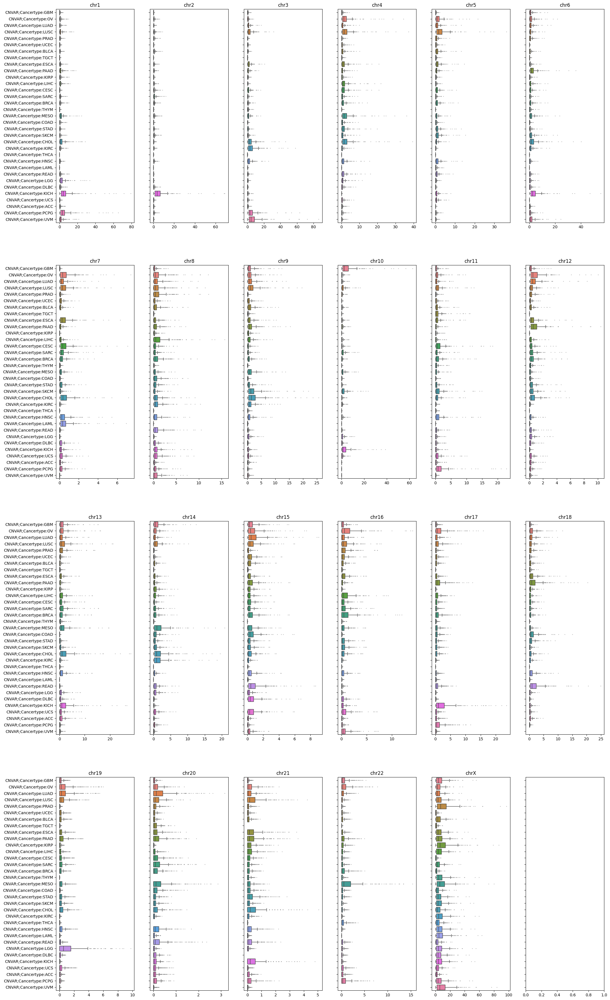

In [28]:
fig, axs = plt.subplots(4, 6, figsize=(25, 45), sharey=True)
for i, c in enumerate(chroms[:-1]):
    df = pd.read_csv(parent_dir+f'/analysis/experiment11/loss/{c}__n_hits.csv', index_col=False)
    df = df.rename(columns={'Unnamed: 0': 'CoTE'})
    df = df.set_index('CoTE')
    sns.boxplot(df, orient='h', showfliers=True, ax=axs.flatten()[i], flierprops=dict(marker='o', markersize=0.5, linestyle='none', markeredgecolor='grey'))
    axs.flatten()[i].set_title(f'{c}')
    # sns.stripplot(df, orient='h', jitter=True, ax=axs.flatten()[i], color='grey')
fig.savefig('chr1_n_hits.png', dpi=600, bbox_inches='tight')
plt.show()

In [22]:
c = 'chr7'
df = pd.read_csv(parent_dir+f'/analysis/experiment15/loss/{c}__n_hits.csv', index_col=False)

In [23]:
df.sort_values('CNVAR;Cancertype:GBM', ascending=False)

,Unnamed: 0,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:HNSC,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM
239,COTEs;COTEs>643_L2a,0.714286,19.257194,11.234592,17.993902,2.890985,5.287645,3.681122,17.005525,4.312849,...,14.764244,19.000000,1.196078,0.432866,4.869565,5.769231,8.054545,3.255556,7.780347,0.415584
319,COTEs;COTEs>646_L2c,0.418787,12.602518,7.604374,12.223577,1.901468,3.577220,2.448980,11.629834,2.960894,...,10.222004,12.809783,0.764706,0.352705,3.673913,3.861538,5.490909,2.211111,5.439306,0.233766
223,COTEs;COTEs>644_L2b,0.266145,7.019784,4.294235,7.355691,1.171908,2.050193,1.466837,7.314917,1.921788,...,6.587426,7.625000,0.470588,0.172345,2.195652,2.215385,3.345455,1.488889,3.092486,0.194805
187,COTEs;COTEs>1141_MIR,0.258317,7.843525,3.765408,5.878049,0.955975,1.945946,1.372449,5.044199,1.117318,...,4.278978,6.250000,0.313725,0.148297,1.739130,2.015385,2.672727,0.911111,2.190751,0.103896
154,COTEs;COTEs>89_AluJr,0.219178,9.616906,6.542744,7.479675,1.098532,2.467181,1.420918,5.740331,1.553073,...,4.622790,8.413043,0.385621,0.525050,0.500000,3.200000,3.127273,0.777778,4.369942,0.025974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,COTEs;COTEs>1365_THE1C-int,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
118,COTEs;COTEs>919_MER102a,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
317,COTEs;COTEs>894_MamGypLTR3a,0.000000,0.037770,0.035785,0.058943,0.014675,0.011583,0.010204,0.071823,0.016760,...,0.060904,0.065217,0.006536,0.000000,0.021739,0.015385,0.018182,0.022222,0.034682,0.000000
376,COTEs;COTEs>533_L1M4b,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


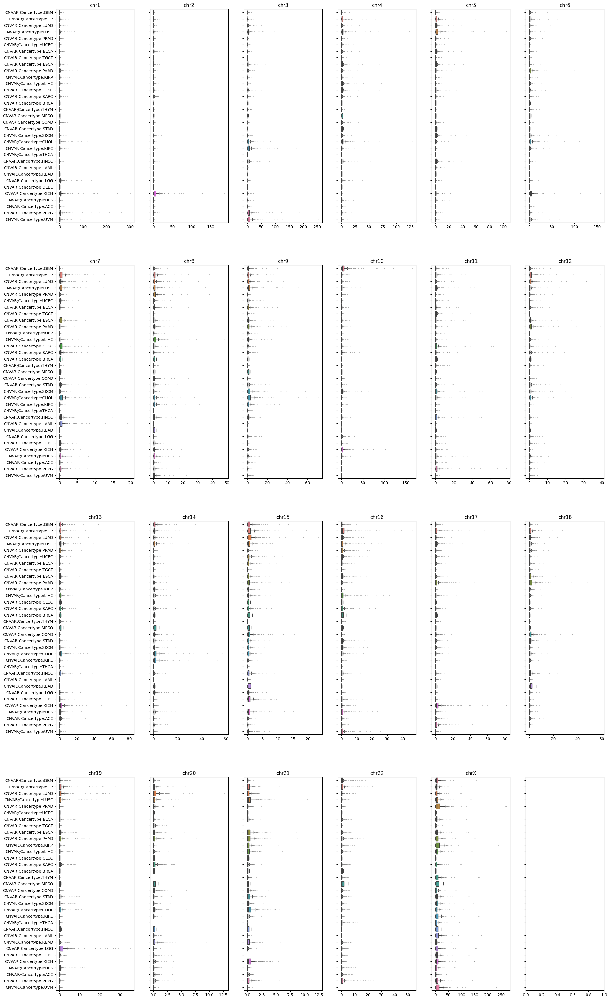

In [27]:
fig, axs = plt.subplots(4, 6, figsize=(25, 45), sharey=True)
for i, c in enumerate(chroms[:-1]):
    df = pd.read_csv(parent_dir+f'/analysis/experiment14/loss/{c}__n_hits.csv', index_col=False)
    df = df.rename(columns={'Unnamed: 0': 'CoTE'})
    df = df.set_index('CoTE')
    sns.boxplot(df, orient='h', showfliers=True, ax=axs.flatten()[i], flierprops=dict(marker='o', markersize=0.5, linestyle='none', markeredgecolor='grey'))
    axs.flatten()[i].set_title(f'{c}')
    # sns.stripplot(df, orient='h', jitter=True, ax=axs.flatten()[i], color='grey')
fig.savefig('chr1_n_hits.png', dpi=600, bbox_inches='tight')
plt.show()

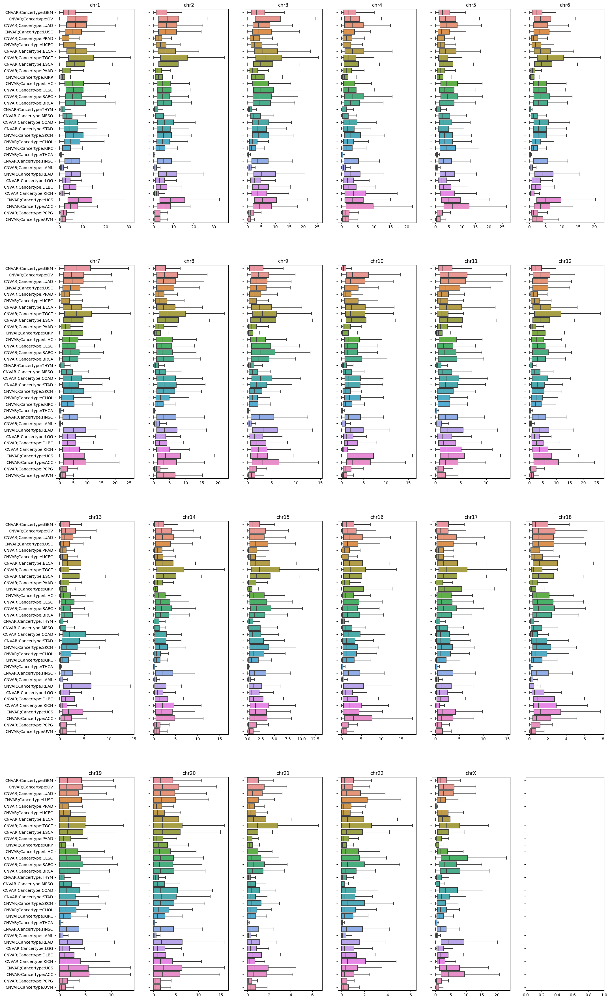

In [47]:
fig, axs = plt.subplots(4, 6, figsize=(25, 45), sharey=True)
for i, c in enumerate(chroms[:-1]):
    df = pd.read_csv(f'/cluster/home/t124771uhn/analysis/experiment11/gain/{c}__n_hits.csv', index_col=False)
    df = df.rename(columns={'Unnamed: 0': 'CoTE'})
    df = df.set_index('CoTE')
    sns.boxplot(df, orient='h', showfliers=False, ax=axs.flatten()[i])
    axs.flatten()[i].set_title(f'{c}')
    # sns.stripplot(df, orient='h', jitter=True, ax=axs.flatten()[i], color='grey')
plt.show()

In [22]:
def preprocess_data(file_path):
    df = pd.read_csv(file_path, index_col=False)
    df = df.rename(columns={'Unnamed: 0': 'CoTE'})
    df['CoTE'] = df['CoTE'].apply(lambda x: '_'.join(x.split('>')[-1].split('_')[1:]))
    df.rename({i: i.split(':')[-1] for i in df.columns}, axis=1, inplace=True)
    df = df.set_index('CoTE')
    return df
def adjust_tables(df_gain, df_loss):
    gc = list(set(list(df_gain.columns)) - set(list(df_loss.columns)))
    for c in gc:
        df_loss[c]=1
    lc = list(set(list(df_loss.columns)) - set(list(df_gain.columns)))
    for c in gc:
        df_gain[c]=1
    
def lg_heatmap(c = 'chr8', orient='h', exp=11):
    cts = [t.split('.bed')[0].split('_Merged')[0] for t in os.listdir(cotes_dir)]
    
    df_gain = pd.read_csv(f'/Users/mossishahi/Code/lupien/IntData/analysis/experiment{exp}/gain/{c}__qval_n_hit.csv', index_col=False)
    df_gain = df_gain.rename(columns={'Unnamed: 0': 'CoTE'})
    df_gain['CoTE'] = df_gain['CoTE'].apply(lambda x: '_'.join(x.split('>')[-1].split('_')[1:]))
    df_gain.rename({i:i.split(':')[-1] for i in df_gain.columns}, axis=1, inplace=True)
    df_gain = df_gain.set_index('CoTE')
    
    df_loss = pd.read_csv(f'/Users/mossishahi/Code/lupien/IntData/analysis/experiment{exp}/loss/{c}__qval_n_hit.csv', index_col=False)
    df_loss = df_loss.rename(columns={'Unnamed: 0': 'CoTE'})
    df_loss['CoTE'] = df_loss['CoTE'].apply(lambda x: '_'.join(x.split('>')[-1].split('_')[1:]))
    df_loss.rename({i:i.split(':')[-1] for i in df_loss.columns}, axis=1, inplace=True)
    df_loss = df_loss.set_index('CoTE')
    if len(cts) < df_gain.shape[0]:
        print('TEs found')
        df_gain = df_gain.loc[[i.split(':')[-1] in cts for i in df_gain.index],:].copy()
        df_loss = df_loss.loc[[i.split(':')[-1] in cts for i in df_loss.index],:].copy()
    adjust_tables(df_gain, df_loss)
    row_linkage = hierarchy.linkage(df_gain, method='average')
    col_linkage = hierarchy.linkage(df_gain.T, method='average')
    row_order = hierarchy.leaves_list(row_linkage)
    col_order = hierarchy.leaves_list(col_linkage)
    # plt.show()
    vmin = 0
    vmax = 1
    fig, axs = plt.subplots(2, 1, figsize=(50, 10), sharex=True)
    plt.suptitle(f'Copy Number Variation in different Cancer types vs Prescence/Abscence of CoTE in Mbp of {c}', fontsize=16 ,ha='center', y=1.02)
    sns.heatmap(df_gain.iloc[row_order, col_order] if orient=='v' else df_gain.T.iloc[col_order, row_order], square=True, ax=axs.flatten()[0], cbar=False, vmin=vmin, vmax=vmax)
    axs.flatten()[0].set_title('CNV Gain Locus', fontsize=16, pad=20)
    sns.heatmap(df_loss.iloc[row_order, col_order] if orient=='v' else df_loss.T.iloc[col_order, row_order], square=True, ax=axs.flatten()[1], cbar=False, vmin=vmin, vmax=vmax)
    axs.flatten()[1].set_title('CNV Loss Locus', fontsize=16, pad=20)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    # plt.subplots_adjust(left=0.15)  # Adjust as needed
    plt.subplots_adjust(left=0.15, top=.75, hspace=0.3)
    plt.show()
    return df_gain, df_loss

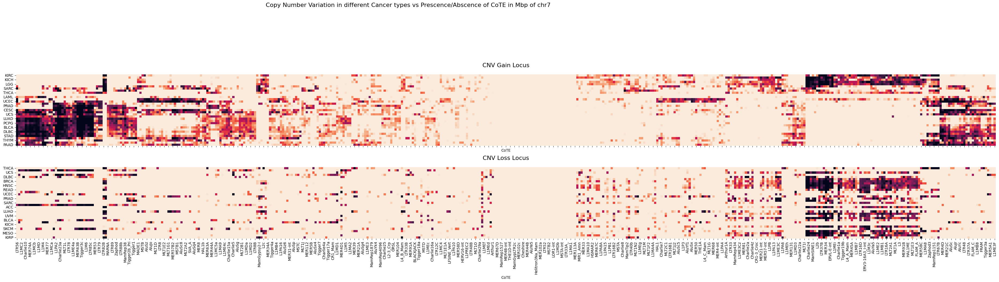

In [23]:
df_gain, df_loss = lg_heatmap('chr7', exp=11)

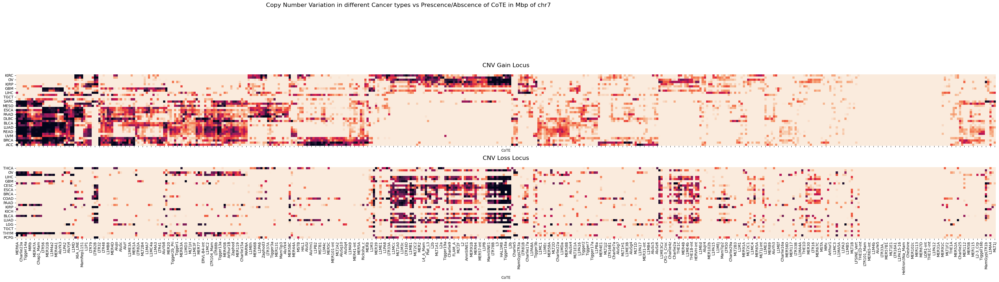

In [24]:
df_gain, df_loss = lg_heatmap('chr7', exp=14)

In [25]:
df_gain

,GBM,OV,LUAD,LUSC,PRAD,UCEC,BLCA,TGCT,ESCA,PAAD,...,HNSC,LAML,READ,LGG,DLBC,KICH,UCS,ACC,PCPG,UVM
CoTE,,,,,,,,,,,,,,,,,,,,,
MIRc,1.000000,1.000000,1.000000,1.000000,1.000000,0.704079,1.000000,1,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.893048,1.000000,1.000000
MLT1O,1.000000,0.988412,1.000000,1.000000,1.000000,1.000000,1.000000,1,1.000000,1.000000,...,1.000000,1.000000,1.000000,0.927245,1.000000,0.976942,1.000000,1.000000,1.000000,1.000000
AluYj4,0.710799,1.000000,0.377773,0.354578,1.000000,1.000000,0.454924,1,0.340423,0.282723,...,0.292443,0.196697,0.563651,1.000000,0.067490,1.000000,0.354578,0.090600,0.567582,0.686909
Kanga2_a,0.783894,1.000000,0.454924,1.000000,0.113250,0.398640,0.820959,1,1.000000,1.000000,...,0.507883,1.000000,0.180380,1.000000,1.000000,1.000000,1.000000,0.316381,0.225259,0.162995
HERVH-int,1.000000,0.839965,1.000000,1.000000,1.000000,1.000000,1.000000,1,1.000000,1.000000,...,1.000000,1.000000,1.000000,0.808289,1.000000,0.753607,1.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
L4_C_Mam,1.000000,1.000000,1.000000,1.000000,0.844400,0.805923,1.000000,1,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.847784,0.774925,1.000000,0.893048,1.000000,1.000000
ERVL-B4-int,1.000000,1.000000,0.751653,1.000000,1.000000,0.911158,0.878506,1,0.956613,1.000000,...,0.898179,1.000000,0.716991,1.000000,0.000000,1.000000,0.556435,0.563651,0.711336,0.715211
L1M1,1.000000,1.000000,1.000000,1.000000,1.000000,0.632935,1.000000,1,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.967964,1.000000,0.630261,1.000000,0.982867,1.000000


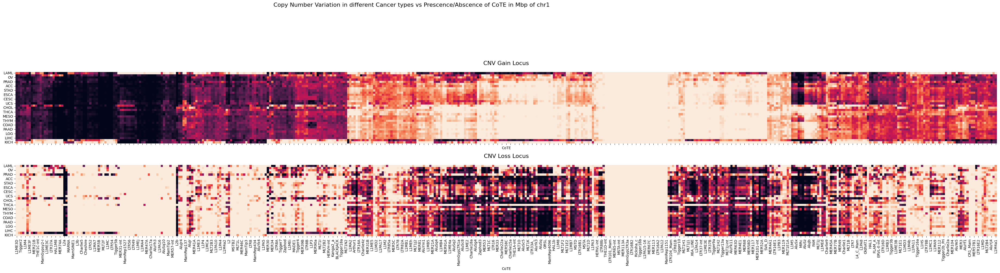

In [56]:
df_gain, df_loss = lg_heatmap('chr1', exp=13)

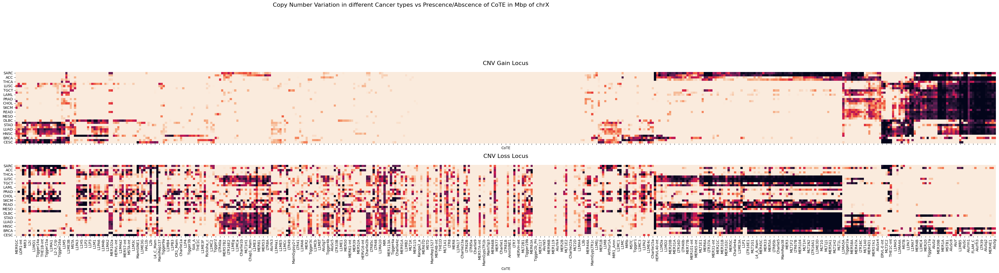

In [58]:
df_gain, df_loss = lg_heatmap('chrX', exp=11)

TEs found


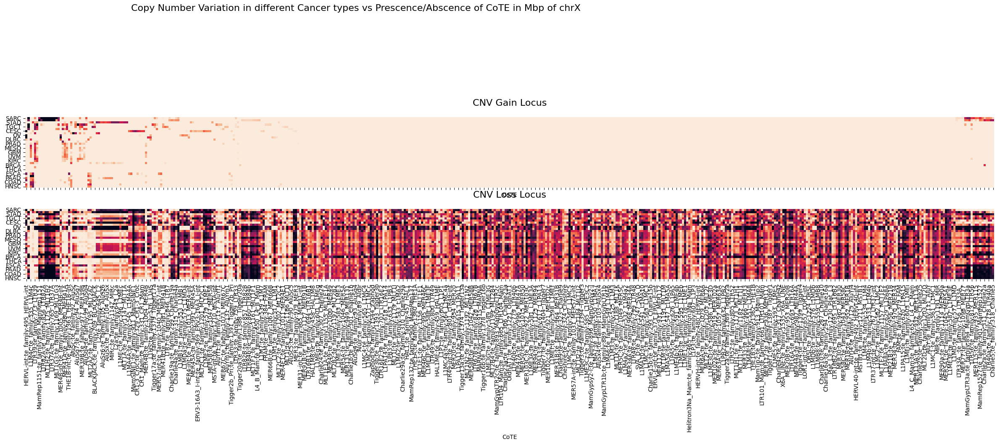

In [60]:
df_gain, df_loss = lg_heatmap('chrX', exp=12)

In [24]:
c = 'chr1'
df = pd.read_csv(f'/cluster/home/t124771uhn/analysis/experiment15/loss/{c}__spcf_n_hits.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/cluster/home/t124771uhn/analysis/experiment15/loss/chr1__spcf_n_hits.csv'

In [119]:
df.sort_values(by='CNVAR;Cancertype:LGG', ascending=False)

,Unnamed: 0,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,...,CNVAR;Cancertype:HNSC,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM
157,COTEs;COTEs>643_L2a,3.478623,8.639328,6.823672,13.368104,5.233818,2.045609,4.715473,1.184604,7.863533,...,4.969730,0.133853,9.530189,28.891573,7.596859,70.230117,2.600933,5.659044,56.736313,18.229403
123,COTEs;COTEs>646_L2c,2.899780,7.369753,6.101774,11.946882,4.845891,1.752730,4.223096,1.049892,7.046258,...,4.380011,0.091817,8.482672,25.949328,6.687602,63.624716,2.136844,5.076692,51.432500,16.442248
11,COTEs;COTEs>1141_MIR,2.626158,6.860093,5.561892,10.991721,3.796755,1.665518,3.632995,0.980588,6.105182,...,3.909950,0.061173,7.792204,24.146359,5.645857,53.126138,2.061920,4.704270,46.779502,15.408589
376,COTEs;COTEs>644_L2b,2.739322,7.208709,5.267824,10.636516,3.893850,1.673100,3.721468,0.974331,6.099450,...,3.797631,0.090619,7.785364,23.038920,5.826356,55.601807,2.142142,4.658752,44.698881,14.707687
433,COTEs;COTEs>1140_MIRb,2.392261,6.479994,4.966833,9.879190,3.655315,1.532009,3.331675,0.900495,5.533323,...,3.503943,0.066942,7.130394,21.564954,5.338607,48.997572,1.857336,4.318533,41.871220,13.827120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,COTEs;COTEs>1210_MSTA-int,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
83,COTEs;COTEs>695_LTR16B2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
150,COTEs;COTEs>894_MamGypLTR3a,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
242,COTEs;COTEs>1240_Ricksha_c,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [115]:
df['CNVAR;Cancertype:KICH']

0      0.618756
1      0.310836
2      5.345667
3      6.339161
4      7.898830
         ...   
448    0.640896
449    5.558582
450    1.562396
451    2.468519
452    1.880194
Name: CNVAR;Cancertype:KICH, Length: 453, dtype: float64

In [59]:
sdf.index.name = 'pvalue'

/tmp/ipykernel_375/889355042.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=90)
/tmp/ipykernel_375/889355042.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=90)
/tmp/ipykernel_375/889355042.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=90)


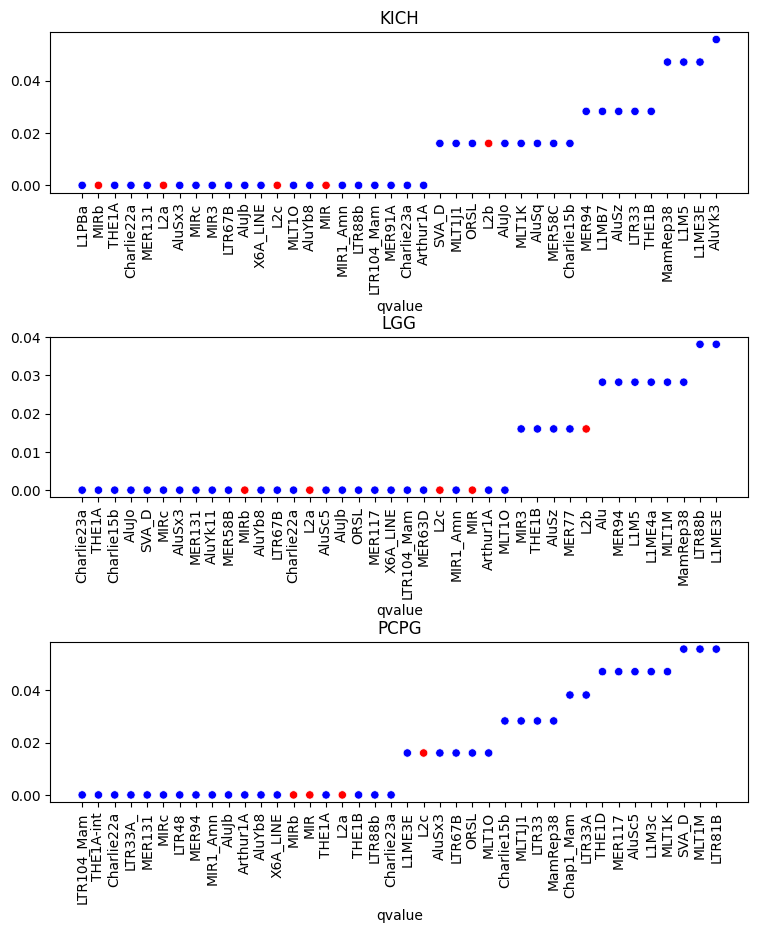

In [120]:
fig, axs = plt.subplots(3, 1, figsize=(9, 10), )
plt.xticks(rotation=90)
for i, ct in enumerate(['KICH', 'LGG', 'PCPG']):
    # Now plot using these colors
    sdf = df_loss[ct].sort_values(ascending=True).iloc[:40, ]
    sdf.index.name='qvalue'
    hue_colors = ['red' if v in ['L2a', 'L2c', 'MIR', 'L2b', 'MIRb'] else 'blue' for v in sdf.index]
    # Create the scatterplot with hue set to your list of colors
    sns.scatterplot(x=sdf.index, y=sdf.values, hue=hue_colors, palette=['blue', 'red'], legend=False, ax=axs.flatten()[i])
    axs.flatten()[i].set_title(ct)
    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=90)
fig.subplots_adjust(hspace=.9)  # Adjust the amount of width space between subplots
fig.savefig('pval_valid.png', bbox_inches='tight', dpi=600)
plt.show()

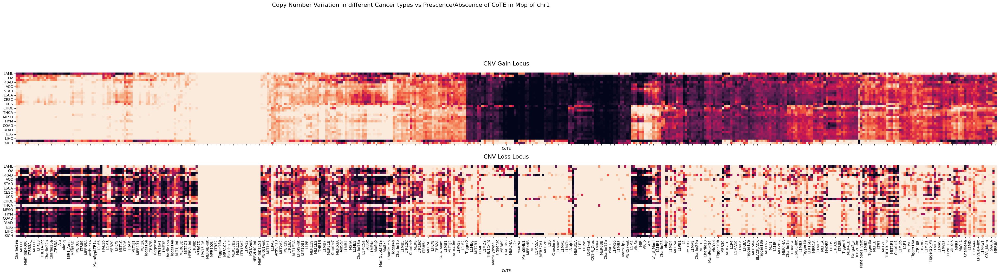

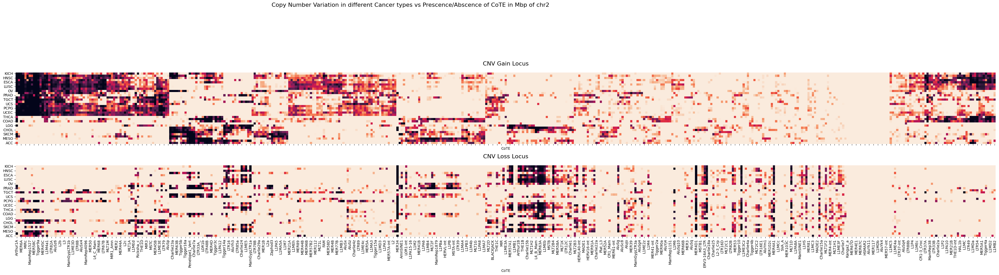

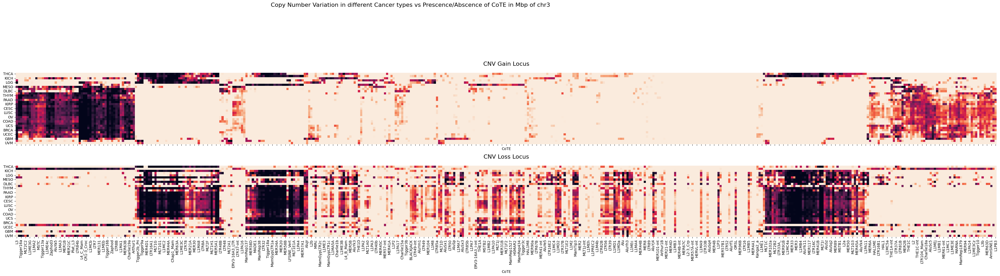

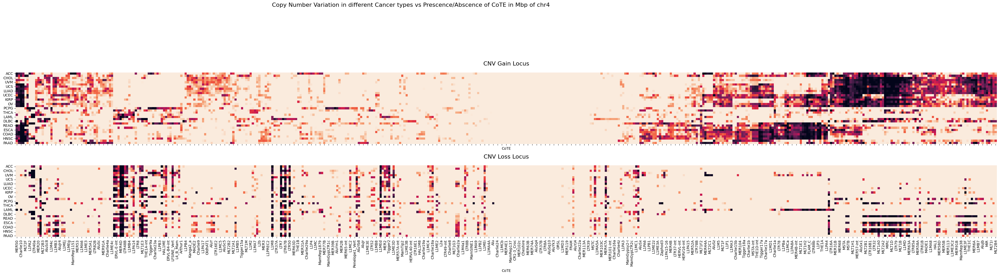

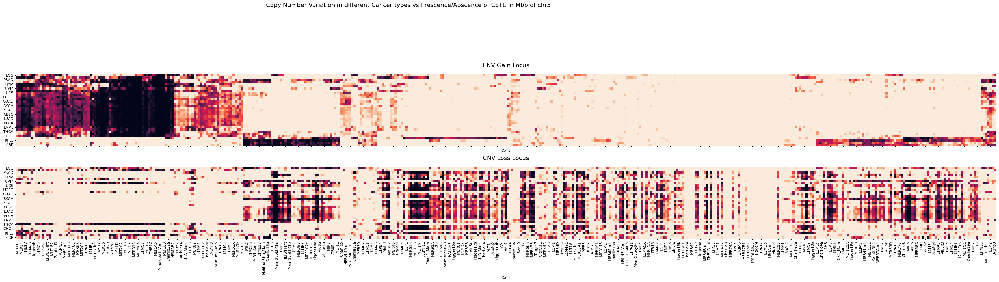

...

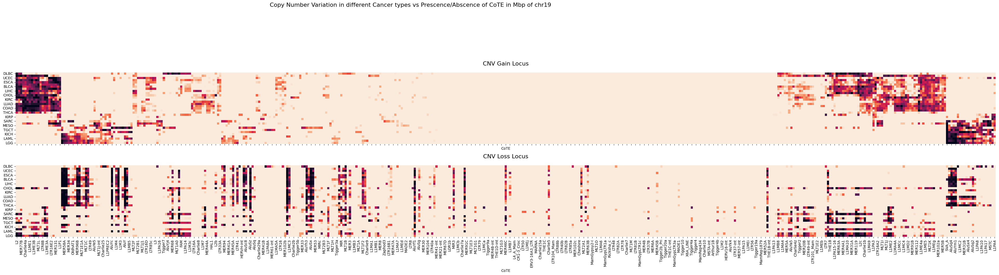

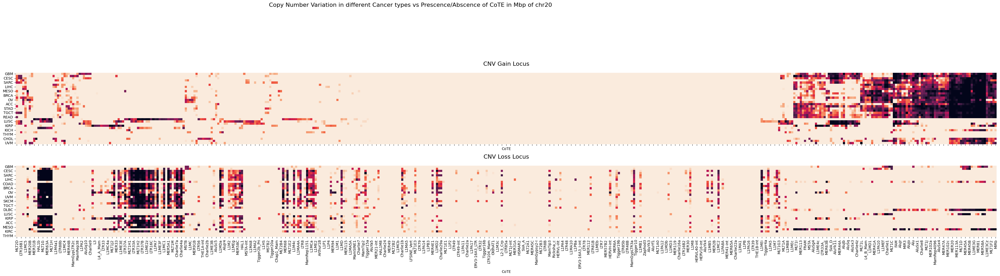

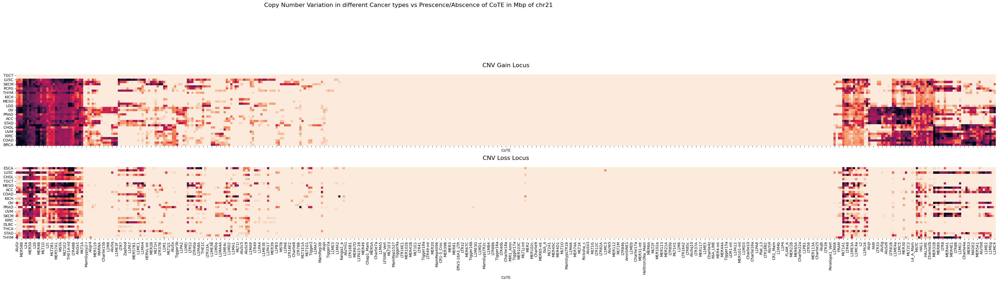

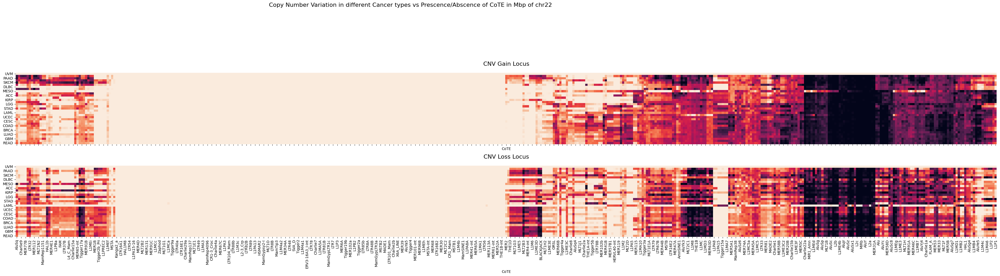

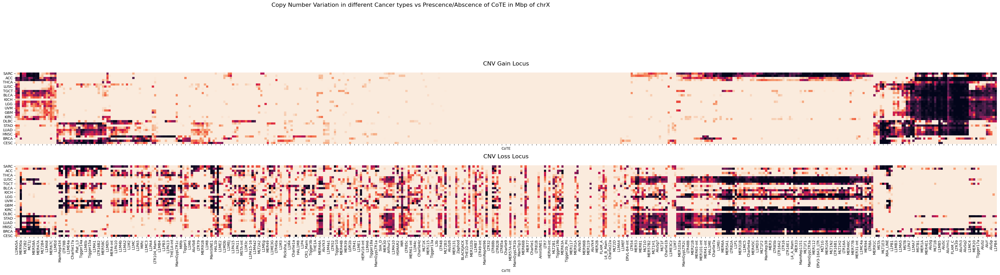

FileNotFoundError: [Errno 2] No such file or directory: '/cluster/home/t124771uhn/analysis/experiment10/gain/chrY__qval_n_hit.csv'

In [223]:
for c in chroms[:-1]:
    lg_heatmap(c=c)

In [107]:
import h5py
import csv
def flatten_h5_to_csv(input_path, output_dir):
    # Extract the base name without extension
    base_name = os.path.basename(input_path)
    base_name_without_ext = os.path.splitext(base_name)[0]
    
    # Define the CSV output path
    csv_output_path = os.path.join(output_dir, base_name_without_ext + '.csv')
    
    # Load the .h5 file and read the data
    with h5py.File(input_path, 'r') as file:
        # Assuming the dataset is the first key
        dataset_name = list(file.keys())[0]
        data = file[dataset_name][:]
        
        # Flatten the entire 3D array into a 1D array and convert it to a list
        flattened_data = data.flatten().tolist()
        # Prepend the dimensions (depth, rows, columns) to the list
        data_with_dims = [data.shape[0], data.shape[1], data.shape[2]] + flattened_data
        
        # Open a new CSV file for writing the 1D array
        with open(csv_output_path, mode='w', newline='') as csv_file:
            writer = csv.writer(csv_file)
            # Write the 1D array as a single row in the CSV file
            writer.writerow(data_with_dims)

In [110]:
path = '/cluster/home/t124771uhn/analysis/experiment11/loss/hits/'
files = os.listdir(path)
for f in files:
    p = os.path.join(path, f)
    flatten_h5_to_csv(p, '/cluster/home/t124771uhn/loss_hits/')